ENV = gat_gpu

In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import os
os.chdir("/home/dalai/GNN_E")

import pandas as pd
from math import ceil
import gc
from torchsummary import summary
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

import torch
import torch.optim as optim

# Out libraries
from scripts.utils import *
from scripts.models import *

print(torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
print(torch.__version__)

/home/dalai/.conda/envs/gat_gpu/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True
cuda
1.13.1+cu116


In [2]:
# Load all movies with labels csv
df_all_movies = pd.read_csv("data/processed/all_movies_labelled_13_single.csv")
num_classes = 13 # based on df_movie choosen
batch_size = 32

# Df rest only in case you want to predict between rest and movie
df_rest = pd.read_csv("/home/dalai/GNN_E/data/raw/rest/Rest_compiled414_processed.csv")

In [3]:
# Split in train and test
df_train, df_val, df_test = split_train_val_test_horizontally(
    df_all_movies, 
    percentage_train=0.8, 
    percentage_val=0.0, #0 to not have nay val set
    path_pickle_delay="data/raw/labels/run_onsets.pkl",
    path_movie_title_mapping="data/raw/labels/category_mapping_movies.csv", 
    tr_len=1.3
)

# In case predict between rest ans movie
#df_train, df_test = split_train_test_rest_classification(df_all_movies, df_rest)


Movie: AfterTheRain
  Start Time (TR)+4: 80
  Total Length (TR): 382
  Train End (TR): 385
  Validation End (TR): 385
  Movie End (TR): 462

Movie: BetweenViewings
  Start Time (TR)+4: 79
  Total Length (TR): 622
  Train End (TR): 576
  Validation End (TR): 576
  Movie End (TR): 701

Movie: BigBuckBunny
  Start Time (TR)+4: 79
  Total Length (TR): 377
  Train End (TR): 380
  Validation End (TR): 380
  Movie End (TR): 456

Movie: Chatter
  Start Time (TR)+4: 79
  Total Length (TR): 312
  Train End (TR): 328
  Validation End (TR): 328
  Movie End (TR): 391

Movie: FirstBite
  Start Time (TR)+4: 79
  Total Length (TR): 461
  Train End (TR): 447
  Validation End (TR): 447
  Movie End (TR): 540

Movie: LessonLearned
  Start Time (TR)+4: 79
  Total Length (TR): 513
  Train End (TR): 489
  Validation End (TR): 489
  Movie End (TR): 592

Movie: Payload
  Start Time (TR)+4: 79
  Total Length (TR): 775
  Train End (TR): 699
  Validation End (TR): 699
  Movie End (TR): 854

Movie: Sintel
  Start

In [4]:
print(df_train[df_train.label != -1]["label"].count() /414)
print(df_test[df_test.label != -1]["label"].count() /414)


177095.0
44455.0


In [5]:
half_wind_size = 4

X_train, y_train = create_feature_label_tensors_for_FNN(
    df_train, 
    sizewind=half_wind_size
)
print(X_train.shape) # samples x nodes x window
print(y_train.shape) # samples

X_test, y_test = create_feature_label_tensors_for_FNN(
    df_test, 
    sizewind=half_wind_size
)
print(X_test.shape) # samples x nodes x window
print(y_test.shape) # samples

Movies in this df: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Processing movie: 0, subject: 1, timepoint: 0/306
Processing movie: 0, subject: 1, timepoint: 1/306
Processing movie: 0, subject: 1, timepoint: 2/306
Processing movie: 0, subject: 1, timepoint: 3/306
Processing movie: 0, subject: 1, timepoint: 4/306
Processing movie: 0, subject: 1, timepoint: 5/306
Processing movie: 0, subject: 1, timepoint: 6/306
Processing movie: 0, subject: 1, timepoint: 7/306
Processing movie: 0, subject: 1, timepoint: 8/306
Processing movie: 0, subject: 1, timepoint: 9/306
Processing movie: 0, subject: 1, timepoint: 10/306
Processing movie: 0, subject: 1, timepoint: 11/306
Processing movie: 0, subject: 1, timepoint: 12/306
Processing movie: 0, subject: 1, timepoint: 13/306
Processing movie: 0, subject: 1, timepoint: 14/306
Processing movie: 0, subject: 1, timepoint: 15/306
Processing movie: 0, subject: 1, timepoint: 16/306
Processing movie: 0, subject: 1, timepoint: 17/306
Processing movie: 0, subject:

In [6]:
# Reshape to (samples, nodes * window)

samples_train = X_train.shape[0]
X_train = X_train.view(samples_train, -1)  # or X.reshape(samples, nodes * window)
print(X_train.shape)

samples_test = X_test.shape[0]
X_test = X_test.view(samples_test, -1)  # or X.reshape(samples, nodes * window)
print(X_test.shape)

torch.Size([177095, 3726])
torch.Size([44455, 3726])


In [7]:
# Move tensors to gpu
X_train.to(device)
y_train.to(device)
X_test.to(device)
y_test.to(device)

tensor([5, 5, 5,  ..., 2, 2, 2], device='cuda:0')

In [8]:
# Create Model

n_nodes = 414

model = FNN(
    input_size = n_nodes * (1 + 2*half_wind_size), #n_features = n_nodes x window_size
    output_size = num_classes, #n_classes, it return softmax
    hidden_dims = [1500, 1000, 500, 300, 100],  # List of hidden layer sizes
    initializer="he"
)

model.to(device)

summary(model, (batch_size, n_nodes * (1 + 2*half_wind_size)))  # Adjust input size accordingly


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1             [-1, 32, 1500]       5,590,500
         LeakyReLU-2             [-1, 32, 1500]               0
            Linear-3             [-1, 32, 1000]       1,501,000
         LeakyReLU-4             [-1, 32, 1000]               0
            Linear-5              [-1, 32, 500]         500,500
         LeakyReLU-6              [-1, 32, 500]               0
            Linear-7              [-1, 32, 300]         150,300
         LeakyReLU-8              [-1, 32, 300]               0
            Linear-9              [-1, 32, 100]          30,100
        LeakyReLU-10              [-1, 32, 100]               0
           Linear-11               [-1, 32, 13]           1,313
Total params: 7,773,713
Trainable params: 7,773,713
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.45
Forw

In [9]:
# Train

losses_train, losses_val = model.train_model(
                                X_train = X_train, 
                                Y_train = y_train,  
                                X_val = X_test, 
                                Y_val = y_test, 
                                optimizer="adam", 
                                learning_rate=0.0001, 
                                epochs=40, 
                                batch_size=batch_size
                    )

Epoch 1/40, Train Loss: 3.2021, Val Loss: 2.8795


Epoch 2/40, Train Loss: 2.0634, Val Loss: 3.3115
Epoch 3/40, Train Loss: 1.4866, Val Loss: 4.2249
Epoch 4/40, Train Loss: 0.9945, Val Loss: 4.7498
Epoch 5/40, Train Loss: 0.6922, Val Loss: 5.8308
Epoch 6/40, Train Loss: 0.5209, Val Loss: 6.2704
Epoch 7/40, Train Loss: 0.4202, Val Loss: 6.8921
Epoch 8/40, Train Loss: 0.3571, Val Loss: 7.6228
Epoch 9/40, Train Loss: 0.3135, Val Loss: 7.4154
Epoch 10/40, Train Loss: 0.2800, Val Loss: 8.5154
Epoch 11/40, Train Loss: 0.2533, Val Loss: 8.5225
Epoch 12/40, Train Loss: 0.2378, Val Loss: 9.0845
Epoch 13/40, Train Loss: 0.2168, Val Loss: 9.3236
Epoch 14/40, Train Loss: 0.2089, Val Loss: 9.3986
Epoch 15/40, Train Loss: 0.1957, Val Loss: 9.3021
Epoch 16/40, Train Loss: 0.1836, Val Loss: 9.8328
Epoch 17/40, Train Loss: 0.1783, Val Loss: 10.0306
Epoch 18/40, Train Loss: 0.1683, Val Loss: 10.1661
Epoch 19/40, Train Loss: 0.1606, Val Loss: 11.1676
Epoch 20/40, Train Loss: 0.1536, Val Loss: 10.1525
Epoch 21/40, Train Loss: 0.1488, Val Loss: 10.8108
Epo

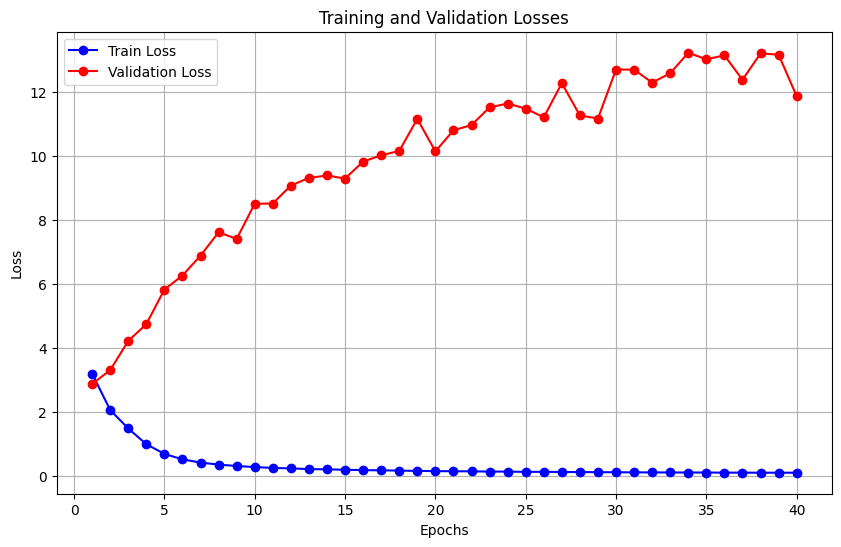

In [10]:
# plots losses

epochs = range(1, len(losses_train) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, losses_train, label='Train Loss', color='blue', marker='o')
plt.plot(epochs, losses_val, label='Validation Loss', color='red', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

In [11]:
# Predict on test
y_test_pred = model.predict(X_test)
y_test_pred

# Ensure y_test_pred is on the CPU before converting it to NumPy
y_test_pred_cpu = y_test_pred.cpu().numpy()

# Now you can calculate accuracy
accuracy = accuracy_score(y_test, y_test_pred_cpu)

print(f"Accuracy: {accuracy * 100:.2f}%")



Accuracy: 8.65%
